In [1]:
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

class Sandpile:
    top = 4
    DEBUG = True
    
    def __init__(self, source = (3,3)):
        if isinstance(source, Sandpile):
            self.value = np.array(source.value)
        elif isinstance(source, (np.ndarray, list)):
            self.value = np.array(source)
        elif isinstance(source, (tuple)):
            self.value = np.zeros(source)
        elif isinstance(source, str):
            self.value = np.loadtxt(source)
        else:
            raise TypeError("Data type not understood")
        
        self.rows, self.cols = self.value.shape
        self.zero = None
        self.opposite = None
        
    def __add__(self, other):
        new = self.value + (other.value if isinstance(other, self.__class__) else other)
        while np.max(new) >= self.top:
#            print("NEW", new[45:55, 45:55])
#            input(">")
            for i, j in np.argwhere(new >= self.top):
                new[i, j] -= self.top
                if i>0:
                    new[i-1, j] += 1
                if i<self.rows-1:
                    new[i+1, j] += 1
                if j>0:
                    new[i, j-1] += 1
                if j<self.cols-1:
                    new[i, j+1] += 1
        return Sandpile(new)
    
    def __sub__(self, other):
        other = -other
        return self + other if other.opposite is not None else None
    
    def __neg__(self):
        if self.opposite is None:
            self.find_opposite()
        return self.opposite
    
    def __eq__(self, other):
        return (self.value == other.value).all()
        
    def __str__(self):
        return str(self.value)
    
    def __repr__(self):
        return str(self)
    
    def generate_random(dims=(3,3)):
        return Sandpile(np.random.randint(0, Sandpile.top, dims))
    
    def draw(self, outputfilename=None, size=(12, 12), **save_opt):
#        cmap = mpl.colors.ListedColormap(["k", "y", "w"])#'r', 'g', 'b'])
        cmap = mpl.colors.ListedColormap(["purple", "blue", "green", "yellow"])
        plt.matshow(self.value, cmap=cmap)
        plt.colorbar(ticks=np.arange(Sandpile.top), cmap=cmap)
        plt.gcf().set_size_inches(*size)
        if outputfilename is not None:
            plt.gcf().savefig(outputfilename, **save_opt)
        
    def full_set():
        if Sandpile.DEBUG:
            print("Computing full set of sandpiles...")
#        all_sandpiles = []
        s = Sandpile()
        for a in range(Sandpile.top):
            for b in range(Sandpile.top):
                for c in range(Sandpile.top):
                    for d in range(Sandpile.top):
                        for e in range(Sandpile.top):
                            for f in range(Sandpile.top):
                                for g in range(Sandpile.top):
                                    for h in range(Sandpile.top):
                                        for i in range(Sandpile.top):
                                            s.value = np.array([[a, b, c],
                                                                [d, e, f],
                                                                [g, h, i]])
#                                            all_sandpiles.append(Sandpile(s))
                                            yield s
        if Sandpile.DEBUG:
            print("Total #sandpiles", len(all_sandpiles), top**9)
        
    def find_zero(self):
        if Sandpile.DEBUG:
            print("Computing zero...")
        for s in Sandpile.full_set():
            if self + s == self:
                self.zero = Sandpile(s.value)
                break
        if self.zero is None and Sandpile.DEBUG:
            print("There are no zeros for\n{s0}".format(s0=self))

    def find_opposite(self):
        if Sandpile.DEBUG:
            print("Computing opposite...")
        if self.zero is None:
            self.zero = self.find_zero()
        for s in Sandpile.full_set():
            if self + s == self.zero:
                self.opposite = Sandpile(s.value)
                break
        if self.opposite is None and Sandpile.DEBUG:
            print("There are no opposites for\n{s0}".format(s0=self))

In [2]:
a = Sandpile.generate_random()
b = Sandpile.generate_random()

In [3]:
print("A", a)
print("B", b)

A [[3 3 1]
 [0 0 1]
 [1 0 1]]
B [[2 0 1]
 [1 3 3]
 [1 2 3]]


In [4]:
print(a+b)

[[2 2 0]
 [3 2 3]
 [3 0 2]]


In [5]:
all_sandpiles = []
top = 4
for a in range(top):
    for b in range(top):
        for c in range(top):
            for d in range(top):
                for e in range(top):
                    for f in range(top):
                        for g in range(top):
                            for h in range(top):
                                for i in range(top):
                                    s = np.array([[a, b, c], [d, e, f], [g, h, i]])
                                    all_sandpiles.append(Sandpile(s))

print("Total #sandpiles", len(all_sandpiles), top**9)

Total #sandpiles 262144 262144


In [ ]:
def generate_full_set(rows=3, cols=3, top=4):
    size = rows * cols
    SC = []
    A = np.zeros(size)
    def recursive(k):
        print(k)
        if k == size:
            SC.append(Sandpile(A.reshape(rows, cols)))
            print(SC)
            return
        for i in range(top):
            A[k] = i
            recursive(k+1)

    recursive(0)
    return A

SC = generate_full_set()
print("Total #sandpiles", len(SC), top**9)
print(SC)
print(np.any([np.any(x.value!=y.value) for x,y in zip(SC, all_sandpiles)]))


0
1
2
3
4
5
6
7
8
9
[[[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]]]
9
[[[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  1.]]]
9
[[[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  1.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  2.]]]
9
[[[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  1.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  2.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  3.]]]
8
9
[[[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  1.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  2.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  3.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  1.  0.]]]
9
[[[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  0.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  1.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  2.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  0.  3.]], [[ 0.  0.  0.]
 [ 0.  0.  0.]
 [ 0.  1.  0.]], [[ 0.  0.  0.]
 [ 0.  

In [38]:
def find_zeros(s0):
    zeros = []
    for s in all_sandpiles[1:]:
        if s0 + s == s0:
            print("{s}\nis a zero of\n{s0}".format(s0=s0, s=s))
            zeros.append(s)
    if not len(zeros):
        print("There are no zeros for\n{s0}".format(s0=s0))
    return zeros

def find_opposites(s0, zeros=None):
    if zeros is None:
        zeros = find_zeros(s0)
    opps = []
    for zero in zeros:
        for s in all_sandpiles:
            if s0 + s == zero:
                print("{s}\nis an opposite of\n{s0}".format(s0=s0, s=s))
                opps.append(s)
    if not len(opps):
        print("There are no opposites for\n{s0}".format(s0=s0))
    return opps

In [56]:
x = Sandpile.generate_random()
#find_opposite(x)
x.find_zero()
z = x.zero
print(z)

Computing zero...
Computing full set of sandpiles...
Total #sandpiles 262144 262144
[[2 1 2]
 [1 0 1]
 [2 1 2]]


In [40]:
ops = find_opposites(x, zs)

[[2 2 2]
 [3 1 1]
 [0 1 2]]
is an opposite of
[[0 2 0]
 [1 3 3]
 [2 3 0]]


In [41]:
ops

In [121]:
a = [[2, 2, 0],
     [2, 1, 1],
     [0, 1, 3]]
a = Sandpile(np.array(a))

b = [[2, 1, 3],
     [1, 0, 1],
     [0, 1, 0]]
b = Sandpile(np.array(b))
print(a+b)

[[2 1 0]
 [0 3 3]
 [1 2 3]]


In [ ]:
S = []
all3 = Sandpile(np.ones((3, 3))*3)
for s in all_sandpiles:
    splus = s + all3

In [75]:
750**2

562500

In [76]:
dim = 1001
s = Sandpile((dim, dim))
s.value[dim//2, dim//2] = 100000
import time
t0 = time.time()
s = s + 0
print(time.time()-t0)

2034.6405019760132


In [90]:
n = [10**i for i in range(6)]
t = [0.0008189678192138672, 0.000993967056274414, 0.000993967056274414, 0.2414860725402832, 15.775367975234985, 2034.6405019760132]

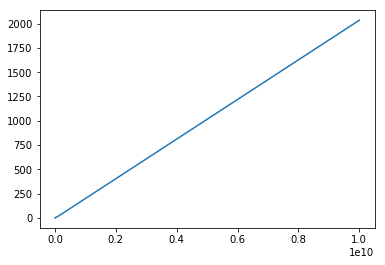

In [91]:
#plt.plot(n, t)
plt.plot(np.square(n), t)

(350, 650)

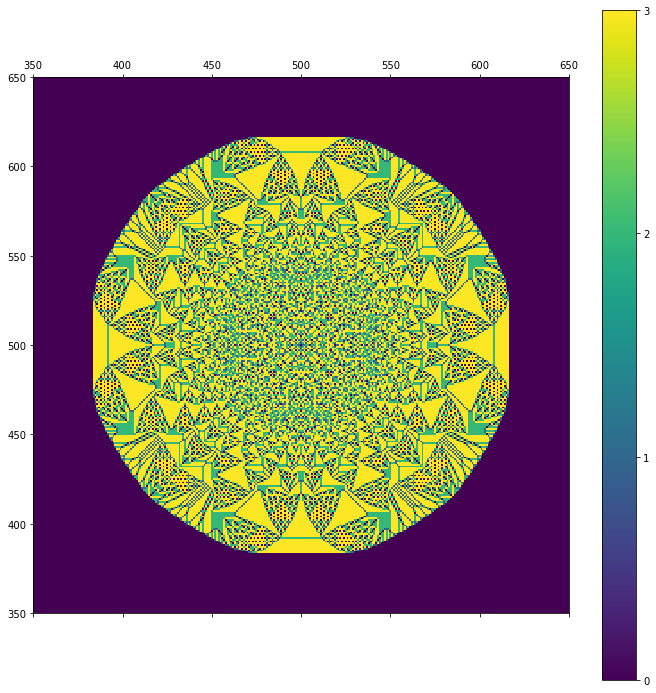

In [87]:
s.draw()
plt.xlim(350,650)
plt.ylim(350,650)


In [192]:
2**30

1073741824

In [89]:
Sandpile(np.array([[0, 3, 1], [2, 3, 2], [1, 0, 3]])) + Sandpile(np.array([[2, 0, 2], [1, 1, 3], [3, 0, 3]]))

[[0 3 2]
 [3 1 2]
 [2 1 1]]

In [37]:
c = Sandpile("/Users/Gonzalo/github/Cplusplus/Sandpiles/10000000.txt")

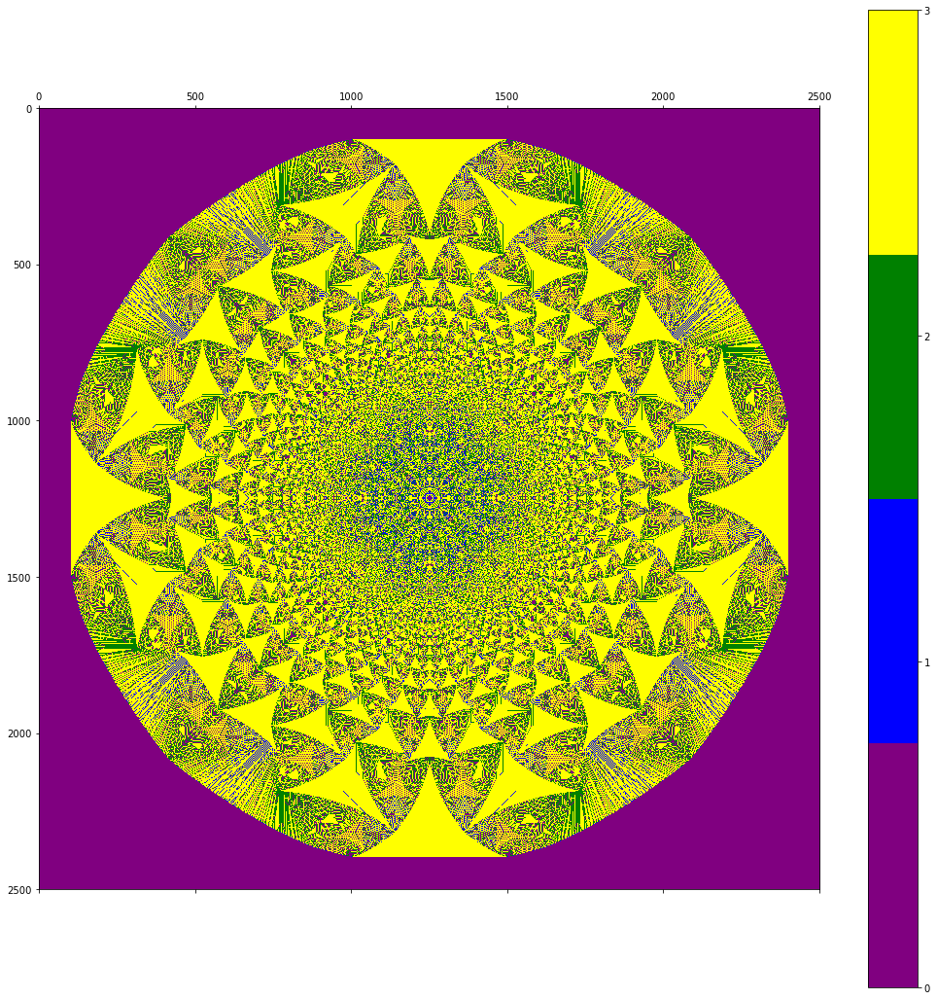

In [38]:
c.draw("1e7.png", (18, 18), dpi=400)

In [26]:
!ls -lah

total 81720
drwxr-xr-x  47 Gonzalo  staff   1.6K Feb 12 15:13 .
drwxr-xr-x  51 Gonzalo  staff   1.7K Jan 31 18:56 ..
-rw-r--r--@  1 Gonzalo  staff    12K Dec 14 14:13 .DS_Store
drwxr-xr-x  15 Gonzalo  staff   510B Jan 26 13:12 .git
drwxr-xr-x  17 Gonzalo  staff   578B Feb  5 18:53 .ipynb_checkpoints
-rw-r--r--@  1 Gonzalo  staff   2.2M Feb 12 15:14 1e7.png
-rw-r--r--   1 Gonzalo  staff   573K Nov 11 14:57 ANASTASIA_CHECK.ipynb
-rw-r--r--   1 Gonzalo  staff   190K Nov 27 18:36 ANASTASIA_ZS_CUT.ipynb
-rw-r--r--   1 Gonzalo  staff    68K Nov 27 16:43 Beautiful_plots.ipynb
-rw-r--r--   1 Gonzalo  staff   451K Nov 16 22:53 DATA_CHECK.ipynb
-rw-r--r--   1 Gonzalo  staff   236K Nov 11 14:57 DATA_CHECK_run2609.ipynb
-rw-r--r--   1 Gonzalo  staff   313K Nov 22 16:40 ENERGY_SCALE.ipynb
-rw-r--r--   1 Gonzalo  staff   951K Dec  1 14:27 Kr.ipynb
-rw-r--r--   1 Gonzalo  staff   132K Nov 22 16:40 Kr_MC_MULTIS1.ipynb
-rw-r--r--   1 Gonzalo  staff   708K Nov 22 15:59 Kr_MC_PREPROD.ipynb
-rw-r--r--   1

In [11]:
colors = dict(mpl.colors.BASE_COLORS, **mpl.colors.CSS4_COLORS)

In [12]:
colors

{'aliceblue': '#F0F8FF',
 'antiquewhite': '#FAEBD7',
 'aqua': '#00FFFF',
 'aquamarine': '#7FFFD4',
 'azure': '#F0FFFF',
 'b': (0, 0, 1),
 'beige': '#F5F5DC',
 'bisque': '#FFE4C4',
 'black': '#000000',
 'blanchedalmond': '#FFEBCD',
 'blue': '#0000FF',
 'blueviolet': '#8A2BE2',
 'brown': '#A52A2A',
 'burlywood': '#DEB887',
 'c': (0, 0.75, 0.75),
 'cadetblue': '#5F9EA0',
 'chartreuse': '#7FFF00',
 'chocolate': '#D2691E',
 'coral': '#FF7F50',
 'cornflowerblue': '#6495ED',
 'cornsilk': '#FFF8DC',
 'crimson': '#DC143C',
 'cyan': '#00FFFF',
 'darkblue': '#00008B',
 'darkcyan': '#008B8B',
 'darkgoldenrod': '#B8860B',
 'darkgray': '#A9A9A9',
 'darkgreen': '#006400',
 'darkgrey': '#A9A9A9',
 'darkkhaki': '#BDB76B',
 'darkmagenta': '#8B008B',
 'darkolivegreen': '#556B2F',
 'darkorange': '#FF8C00',
 'darkorchid': '#9932CC',
 'darkred': '#8B0000',
 'darksalmon': '#E9967A',
 'darkseagreen': '#8FBC8F',
 'darkslateblue': '#483D8B',
 'darkslategray': '#2F4F4F',
 'darkslategrey': '#2F4F4F',
 'darkturquo